## Vertiport Location Optimization
### Data Analysis Capstone Design (SWCON)

#### Junyoung Lee & Tae Kyoung Lee
##### Prof. Myoung Ah Cho

#### Library

In [1]:
import geopandas as gpd
import folium
from IPython.display import display
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from folium import Choropleth
from folium import LayerControl, FeatureGroup
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
import numpy as np
import matplotlib.colors as mcolors
from shapely.geometry import Polygon, box
from pyproj import CRS
from pulp import LpProblem, LpMinimize, LpVariable, lpSum, LpBinary, PULP_CBC_CMD
from shapely.geometry import Point

<Axes: >

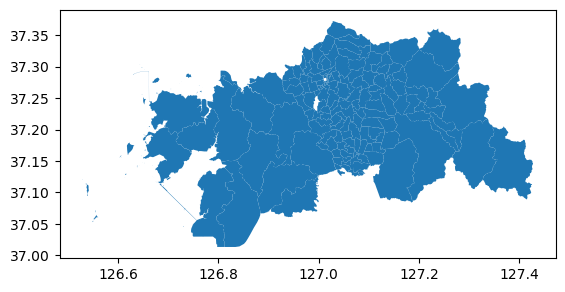

In [2]:
our_region = "/Users/taekyounglee/Documents/projects/DA_Capstone/data/our_region.shp"
gdf = gpd.read_file(our_region)

# # gdf.columns
# # gdf.info()
# # gdf.describe
gdf.plot()

In [3]:
gdf = gdf.to_crs(epsg=4326)

# 중심 좌표 설정
center = [gdf.geometry.centroid.y.mean(), gdf.geometry.centroid.x.mean()]

m = folium.Map(location=center, zoom_start=12)

# GeoDataFrame 데이터를 지도에 추가
for _, row in gdf.iterrows():
    # 폴리곤 경계를 추가
    folium.GeoJson(
        row.geometry,
        tooltip=f"EMD_CD: {row['EMD_CD']}"  # 마우스 오버 시 EMD_CD 표시
    ).add_to(m)

display(m)

/var/folders/j4/2041ftmn23q6ckn4xskb5z9c0000gn/T/ipykernel_6789/2676911147.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = [gdf.geometry.centroid.y.mean(), gdf.geometry.centroid.x.mean()]


#### Scaling

In [4]:
df=pd.read_csv('/Users/taekyounglee/Documents/projects/DA_Capstone/data/all.csv',encoding='utf-8')

columns_to_normalize = ['total', 'transformation', 'city_income', 'starbucks']

# 쉼표를 제거하고 숫자로 변환
for col in columns_to_normalize:
    df[col] = df[col].replace({',': ''}, regex=True).astype(float)

scaler = MinMaxScaler()
df_minmax = scaler.fit_transform(df[columns_to_normalize])
df_minmax = pd.DataFrame(df_minmax, columns=[f'{col}_normalized' for col in columns_to_normalize])

# 원래 DataFrame에 정규화된 값 추가
df = pd.concat([df, df_minmax], axis=1)

# 정규화된 값의 합계를 계산하여 'sum' 열 추가
df['sum'] = df_minmax.sum(axis=1)

In [5]:
gdf['EMD_CD'] = gdf['EMD_CD'].astype(str)
df['EMD_CD'] = df['EMD_CD'].astype(str)
merged_gdf = gdf.merge(df, on='EMD_CD')

In [6]:
min_value = merged_gdf['sum'].min()
max_value = merged_gdf['sum'].max()

# Folium 맵 생성
center = [merged_gdf.geometry.centroid.y.mean(), merged_gdf.geometry.centroid.x.mean()]
m = folium.Map(location=center, zoom_start=12)

# 'sum' 값을 기준으로 색 명도 설정
# 여기서는 sum 값에 따라 색을 설정하는 예시 (만약 `sum` 값이 클수록 색이 밝아짐)
colormap = plt.cm.Reds  # 명도에 따라 색을 설정할 colormap

# GeoJSON 형식으로 각 구역의 속성 데이터를 folium에 추가
for _, row in merged_gdf.iterrows():
    # 'sum' 값을 색의 강도로 매핑
    color = colormap((row['sum'] - min_value) / (max_value - min_value))  # 0에서 1 사이로 정규화
    color_hex = mcolors.rgb2hex(color[:3])  # RGB 값을 HEX로 변환

    folium.GeoJson(
        row.geometry,
        tooltip=f"행정동코드: {row['EMD_CD']}, 가중합: {row['sum']}",  # 툴팁에 정보 표시
        style_function=lambda x, color=color_hex: {
            'fillColor': color,
            'color': 'black',  # 경계선 색
            'weight': 1,
            'fillOpacity': 0.7
        }
    ).add_to(m)

# Jupyter Notebook에서 지도 확인
m

/var/folders/j4/2041ftmn23q6ckn4xskb5z9c0000gn/T/ipykernel_6789/1063707842.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = [merged_gdf.geometry.centroid.y.mean(), merged_gdf.geometry.centroid.x.mean()]


#### 격자 생성

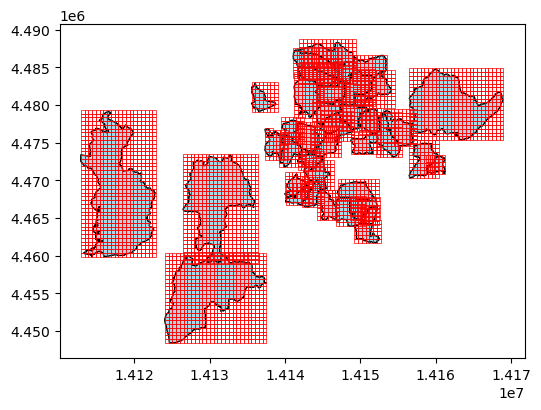

In [7]:
def create_grid(bounds, grid_size=500):
    """격자 범위와 크기를 받아 격자 생성"""
    minx, miny, maxx, maxy = bounds
    grid_cells = []

    # 500m 간격으로 X, Y 범위 생성
    x_coords = np.arange(minx, maxx, grid_size)
    y_coords = np.arange(miny, maxy, grid_size)

    # 격자 셀을 생성
    for x in x_coords:
        for y in y_coords:
            # 각 셀을 사각형으로 만들기
            grid_cells.append(box(x, y, x + grid_size, y + grid_size))

    return grid_cells

# Shapefile과 DataFrame 병합
gdf['EMD_CD'] = gdf['EMD_CD'].astype(str)
df['EMD_CD'] = df['EMD_CD'].astype(str)
merged_gdf = gdf.merge(df, on='EMD_CD')

# 'sum' 값이 2보다 큰 구역 필터링
filtered_gdf = merged_gdf[merged_gdf['sum'] > 1.5]

# 좌표계를 EPSG:3857로 변환 (미터 단위로 작업하기 위해)
filtered_gdf = filtered_gdf.to_crs(epsg=3857)

# 500m x 500m 격자 생성
grid_cells = []
for _, row in filtered_gdf.iterrows():
    # 각 구역의 경계를 가져와서 그리드로 나누기
    bounds = row.geometry.bounds
    grid_cells.extend(create_grid(bounds))

# 격자 데이터를 GeoDataFrame으로 변환
grid_gdf = gpd.GeoDataFrame(geometry=grid_cells, crs=filtered_gdf.crs)

# 격자와 원본 데이터 시각화
fig, ax = plt.subplots(figsize=(6, 6))
filtered_gdf.plot(ax=ax, color='lightblue', edgecolor='black')
grid_gdf.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=0.5)

plt.show()

#### 격자의 위경도 좌표

/var/folders/j4/2041ftmn23q6ckn4xskb5z9c0000gn/T/ipykernel_6789/2987959922.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  grid_gdf['centroid'] = grid_gdf.geometry.centroid


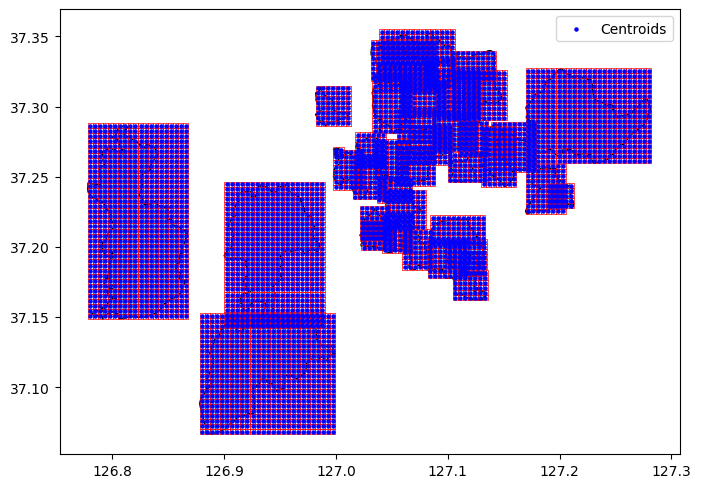

In [8]:
grid_gdf = gpd.GeoDataFrame(geometry=grid_cells, crs=filtered_gdf.crs)
grid_gdf = grid_gdf.to_crs(epsg=4326)

# 격자의 중심 좌표 계산
grid_gdf['centroid'] = grid_gdf.geometry.centroid
grid_gdf['longitude'] = grid_gdf['centroid'].x  # 경도
grid_gdf['latitude'] = grid_gdf['centroid'].y  # 위도


# 격자와 원본 데이터 시각화 (위경도 기준)
fig, ax = plt.subplots(figsize=(8, 8))
filtered_gdf.to_crs(epsg=4326).plot(ax=ax, color='lightblue', edgecolor='black')
grid_gdf.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=0.5)

plt.scatter(grid_gdf['longitude'], grid_gdf['latitude'], color='blue', s=5, label='Centroids')
plt.legend()
plt.show()

In [9]:
grid_gdf['centroid'] = grid_gdf.geometry.centroid

# 중심 좌표를 위경도(EPSG:4326)로 변환
grid_gdf = grid_gdf.to_crs(epsg=4326)
grid_gdf['longitude'] = grid_gdf['centroid'].x  # 중심 경도
grid_gdf['latitude'] = grid_gdf['centroid'].y  # 중심 위도

# 격자의 중심 좌표를 데이터프레임 형태로 출력
grid_centroids = grid_gdf[['longitude', 'latitude']]

/var/folders/j4/2041ftmn23q6ckn4xskb5z9c0000gn/T/ipykernel_6789/3214837500.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  grid_gdf['centroid'] = grid_gdf.geometry.centroid


In [10]:
grid_gdf

,geometry,centroid,longitude,latitude
0,"POLYGON ((126.98622 37.28635, 126.98622 37.289...",POINT (126.98397 37.28814),126.983973,37.288138
1,"POLYGON ((126.98622 37.28992, 126.98622 37.293...",POINT (126.98397 37.29171),126.983973,37.291711
2,"POLYGON ((126.98622 37.2935, 126.98622 37.2970...",POINT (126.98397 37.29528),126.983973,37.295285
3,"POLYGON ((126.98622 37.29707, 126.98622 37.300...",POINT (126.98397 37.29886),126.983973,37.298858
4,"POLYGON ((126.98622 37.30064, 126.98622 37.304...",POINT (126.98397 37.30243),126.983973,37.302431
...,...,...,...,...
4634,"POLYGON ((126.86789 37.2703, 126.86789 37.2738...",POINT (126.86565 37.27209),126.865645,37.272085
4635,"POLYGON ((126.86789 37.27387, 126.86789 37.277...",POINT (126.86565 37.27566),126.865645,37.275659
4636,"POLYGON ((126.86789 37.27745, 126.86789 37.281...",POINT (126.86565 37.27923),126.865645,37.279233
4637,"POLYGON ((126.86789 37.28102, 126.86789 37.284...",POINT (126.86565 37.28281),126.865645,37.282807


#### 제약식 데이터

In [11]:
apartment = pd.read_csv("/Users/taekyounglee/Documents/projects/DA_Capstone/data/apartment_xy.csv", index_col = 0)
nat_env = pd.read_csv('/Users/taekyounglee/Documents/projects/DA_Capstone/data/nat_env_protect.csv', index_col = 0)
facilities = pd.read_csv("/Users/taekyounglee/Documents/projects/DA_Capstone/data/restricted_facilities.csv", index_col = 0)
school = pd.read_csv("/Users/taekyounglee/Documents/projects/DA_Capstone/data/school.csv", index_col = 0)

In [12]:
forest = "/Users/taekyounglee/Documents/projects/DA_Capstone/data/41.shp"
river = "/Users/taekyounglee/Documents/projects/DA_Capstone/data/수도권하천.shp"

forest_gdf = gpd.read_file(forest)
river_gdf = gpd.read_file(river)

In [13]:
apartment = apartment[['HSCOMPLEX_CD',	'SIGNGU_NM',	'EMD_NM',	'Latitude',	'Longitude']]
apartment = apartment.rename(columns = {'Latitude' : 'latitude', 'Longitude' : 'longitude'})
facilities = facilities.rename(columns = {'정제WGS84위도' : 'latitude', '정제WGS84경도' : 'longitude'})
school = school.rename(columns = {'위도' : 'latitude', '경도' : 'longitude'})

#### 데이터 중 격자 내에 있는 좌표만 추출

In [14]:
# grid_polygon = grid_gdf.unary_union

# apartment_gdf = gpd.GeoDataFrame(apartment, geometry=gpd.points_from_xy(apartment.longitude, apartment.latitude), crs="EPSG:4326")
# facilities_gdf = gpd.GeoDataFrame(facilities, geometry=gpd.points_from_xy(facilities.longitude, facilities.latitude), crs="EPSG:4326")
# school_gdf = gpd.GeoDataFrame(school, geometry=gpd.points_from_xy(school.longitude, school.latitude), crs="EPSG:4326")
# nat_env_gdf = gpd.GeoDataFrame(nat_env, geometry=gpd.points_from_xy(nat_env.longitude, nat_env.latitude), crs="EPSG:4326")

# # 그리드 범위 내에 있는 점 데이터 추출
# apartment_in_grid = apartment_gdf[apartment_gdf.geometry.within(grid_polygon)]
# restricted_in_grid = facilities_gdf[facilities_gdf.geometry.within(grid_polygon)]
# school_in_grid = school_gdf[school_gdf.geometry.within(grid_polygon)]
# nat_env_in_grid = nat_env_gdf[nat_env_gdf.geometry.within(grid_polygon)]
# forest_in_grid = forest_gdf[forest_gdf.geometry.within(grid_polygon)]
# river_in_grid = river_gdf[river_gdf.geometry.within(grid_polygon)]

# # 결과 확인
# results = {
#     "apartment_in_grid": apartment_in_grid,
#     "restricted_in_grid": restricted_in_grid,
#     "school_in_grid": school_in_grid,
#     "nat_env_in_grid": nat_env_in_grid,
#     "forest_in_grid": forest_in_grid,
#     "river_in_grid": river_in_grid,
# }

In [15]:
# 함수 정의: 격자 내 첫 번째 포인트만 선택
def filter_points(gdf, grid_gdf):
    # 빈 GeoDataFrame을 기하학적 데이터 열과 함께 생성
    filtered_gdf = gpd.GeoDataFrame(columns=gdf.columns, geometry=gpd.GeoSeries(), crs=gdf.crs)
    for _, grid in grid_gdf.iterrows():
        points_within = gdf[gdf.geometry.within(grid.geometry)]
        if not points_within.empty:
            # filtered_gdf에 첫 번째 포인트를 추가
            filtered_gdf = pd.concat([filtered_gdf, points_within.iloc[[0]]], ignore_index=True)
    return filtered_gdf

# 각 데이터셋을 GeoDataFrame으로 변환
apartment_gdf = gpd.GeoDataFrame(apartment, geometry=gpd.points_from_xy(apartment.longitude, apartment.latitude), crs="EPSG:4326")
facilities_gdf = gpd.GeoDataFrame(facilities, geometry=gpd.points_from_xy(facilities.longitude, facilities.latitude), crs="EPSG:4326")
school_gdf = gpd.GeoDataFrame(school, geometry=gpd.points_from_xy(school.longitude, school.latitude), crs="EPSG:4326")
nat_env_gdf = gpd.GeoDataFrame(nat_env, geometry=gpd.points_from_xy(nat_env.longitude, nat_env.latitude), crs="EPSG:4326")
forest_gdf = gpd.read_file(forest)
river_gdf = gpd.read_file(river)

# 전체 격자를 하나의 멀티폴리곤으로 결합
grid_polygon = grid_gdf.unary_union

# 격자 내 데이터 필터링
apartment_in_grid = filter_points(apartment_gdf, grid_gdf)
restricted_in_grid = filter_points(facilities_gdf, grid_gdf)
school_in_grid = filter_points(school_gdf, grid_gdf)
nat_env_in_grid = filter_points(nat_env_gdf, grid_gdf)
forest_in_grid = filter_points(forest_gdf, grid_gdf)
river_in_grid = filter_points(river_gdf, grid_gdf)

# 결과 확인 및 데이터 저장
results = {
    "apartment_in_grid": apartment_in_grid,
    "restricted_in_grid": restricted_in_grid,
    "school_in_grid": school_in_grid,
    "nat_env_in_grid": nat_env_in_grid,
    "forest_in_grid": forest_in_grid,
    "river_in_grid": river_in_grid,
}


/var/folders/j4/2041ftmn23q6ckn4xskb5z9c0000gn/T/ipykernel_6789/3516473965.py:21: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  grid_polygon = grid_gdf.unary_union
/var/folders/j4/2041ftmn23q6ckn4xskb5z9c0000gn/T/ipykernel_6789/3516473965.py:9: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  filtered_gdf = pd.concat([filtered_gdf, points_within.iloc[[0]]], ignore_index=True)
/var/folders/j4/2041ftmn23q6ckn4xskb5z9c0000gn/T/ipykernel_6789/3516473965.py:9: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, 

In [16]:
apartment_in_grid

,HSCOMPLEX_CD,SIGNGU_NM,EMD_NM,latitude,longitude,geometry
0,A44287003,수원팔달구,화서동,37.287155,126.985329,POINT (126.98533 37.28716)
1,A44073307,수원장안구,정자동,37.292448,126.985493,POINT (126.98549 37.29245)
2,A44071704,수원장안구,천천동,37.296828,126.984490,POINT (126.98449 37.29683)
3,A44072806,수원장안구,정자동,37.300367,126.985787,POINT (126.98579 37.30037)
4,A44030005,수원장안구,정자동,37.307135,126.984991,POINT (126.98499 37.30714)
...,...,...,...,...,...,...
947,A10027187,화성시,남양읍,37.205332,126.833181,POINT (126.83318 37.20533)
948,A44570306,화성시,남양읍,37.208180,126.832119,POINT (126.83212 37.20818)
949,A10024856,화성시,남양읍,37.212593,126.834159,POINT (126.83416 37.21259)
950,A44502001,화성시,남양읍,37.186977,126.855846,POINT (126.85585 37.18698)


In [17]:
restricted_in_grid

,건축물명,면적,정제도로명주소,정제지번주소,latitude,longitude,geometry
0,꽃뫼경로당,78.42,경기도 수원시 팔달구 수성로157번길 27-18,경기도 수원시 팔달구 화서동 678-1,37.287520,126.989024,POINT (126.98902 37.28752)
1,시립정자1동어린이집,664.98,경기도 수원시 장안구 장안로309번길 27,경기도 수원시 장안구 정자동 546-19,37.307468,126.989025,POINT (126.98902 37.30747)
2,정자1동경로당,451,경기도 수원시 장안구 정자로130번길 20,경기도 수원시 장안구 정자동 840-96,37.302204,126.991295,POINT (126.99129 37.3022)
3,세일경로당,247.42,경기도 수원시 장안구 이목로74번길 42,경기도 수원시 장안구 파장동 561,37.310008,126.990723,POINT (126.99072 37.31001)
4,수원병원 증축 및 리모델링,연면적 980㎡,경기도 수원시 장안구 수성로245번길 69,경기도 수원시 장안구 정자동 886-9번지,37.291887,126.996340,POINT (126.99634 37.29189)
...,...,...,...,...,...,...,...
75,원천먼내경로당,115,경기도 수원시 영통구 동탄원천로1109번길 22,경기도 수원시 영통구 원천동 463-1,37.269579,127.057642,POINT (127.05764 37.26958)
76,매원경로당,81.46,경기도 수원시 영통구 신원로276번길 36,경기도 수원시 영통구 원천동 369,37.260313,127.062703,POINT (127.0627 37.26031)
77,영통동경로당,196.92,경기도 수원시 영통구 매영로 421-7,경기도 수원시 영통구 영통동 1017,37.249109,127.077472,POINT (127.07747 37.24911)
78,오목천동어린이집,447.03,경기도 수원시 권선구 서수원로169번길 53,경기도 수원시 권선구 오목천동 520-1,37.243716,126.967323,POINT (126.96732 37.24372)


In [18]:
school_in_grid

,학교명,학교급구분,소재지지번주소,소재지도로명주소,latitude,longitude,geometry
0,율현초등학교,초등학교,경기도 수원시 팔달구 화서동 710,경기도 수원시 팔달구 정자천로32번길 55,37.287229,126.982895,POINT (126.98289 37.28723)
1,정천초등학교,초등학교,경기도 수원시 장안구 천천동 335,경기도 수원시 장안구 화산로 83,37.291238,126.982755,POINT (126.98275 37.29124)
2,천천초등학교,초등학교,경기도 수원시 장안구 천천동 512,경기도 수원시 장안구 정자로42번길 17,37.300584,126.982582,POINT (126.98258 37.30058)
3,효천초등학교,초등학교,경기도 수원시 장안구 정자동 923,경기도 수원시 장안구 천천로21번길 11,37.293466,126.986917,POINT (126.98692 37.29347)
4,수원동신초등학교,초등학교,경기도 수원시 장안구 정자동 870-3,경기도 수원시 장안구 만석로68번길 46,37.295673,126.989176,POINT (126.98918 37.29567)
...,...,...,...,...,...,...,...
485,활초초등학교,초등학교,경기도 화성시 남양읍 안석리 232-1,경기도 화성시 남양읍 안석길111번길 106,37.178777,126.825100,POINT (126.8251 37.17878)
486,남양고등학교,고등학교,경기도 화성시 남양읍 남양리 1633-1,경기도 화성시 남양읍 시청로45번길 23,37.207971,126.823406,POINT (126.82341 37.20797)
487,송린초등학교,초등학교,경기도 화성시 새솔동 0,경기도 화성시 수노을1로 253,37.278231,126.824150,POINT (126.82415 37.27823)
488,신백중학교,중학교,경기도 화성시 남양읍 남양리 2057,경기도 화성시 남양읍 역골중앙로 56-6,37.203437,126.830250,POINT (126.83025 37.20344)


/var/folders/j4/2041ftmn23q6ckn4xskb5z9c0000gn/T/ipykernel_6789/922843902.py:12: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


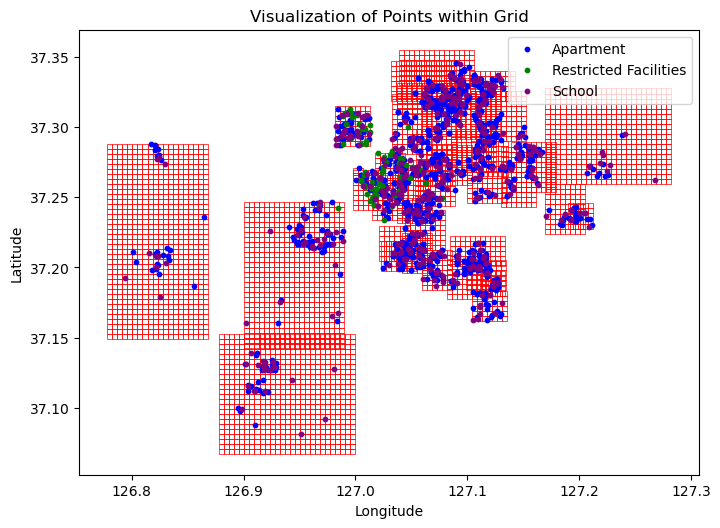

In [19]:
fig, ax = plt.subplots(figsize=(8, 8))

# 그리드 데이터 시각화
grid_gdf.plot(ax=ax, color='none', edgecolor='red', linewidth=0.5, label='Grid')

# 각 데이터 레이어 시각화
apartment_in_grid.plot(ax=ax, color='blue', markersize=10, label='Apartment')
restricted_in_grid.plot(ax=ax, color='green', markersize=10, label='Restricted Facilities')
school_in_grid.plot(ax=ax, color='purple', markersize=10, label='School')

# 범례 추가 및 제목 설정
plt.legend()
plt.title('Visualization of Points within Grid')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# 지도 시각화
plt.show()

In [20]:
def create_geodataframe(df, x='longitude', y='latitude'):
    return gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df[x], df[y]), crs='EPSG:4326')

candidates = create_geodataframe(grid_gdf, 'longitude', 'latitude').to_crs(epsg=3857)
demand_points = create_geodataframe(apartment_in_grid, 'longitude', 'latitude').to_crs(epsg=3857)
restricted_areas = create_geodataframe(restricted_in_grid, 'longitude', 'latitude').to_crs(epsg=3857)
schools = create_geodataframe(school_in_grid, 'longitude', 'latitude').to_crs(epsg=3857)

distance_matrix = np.zeros((len(candidates), len(demand_points)))
valid_candidates = []

for i, candidate in enumerate(candidates.geometry):
    distances = demand_points.geometry.distance(candidate)
    if (distances <= 3000).any():
        valid_candidates.append(i)
    distance_matrix[i] = distances.values

results_dict = {}

def optimize_vertiports(k):
    if len(valid_candidates) < k:
        print(f"Not enough candidates to place {k} vertiports.")
        return []

    problem = LpProblem("Vertiport_Location_Optimization", LpMinimize)
    x = LpVariable.dicts("x", [(i, j) for i in valid_candidates for j in range(len(demand_points))], 0, 1, LpBinary)
    y = LpVariable.dicts("y", valid_candidates, 0, 1, LpBinary)

    problem += lpSum(distance_matrix[i][j] * x[i, j] for i in valid_candidates for j in range(len(demand_points)))

    problem += lpSum(y[i] for i in valid_candidates) == k
    for j in range(len(demand_points)):
        problem += lpSum(x[i, j] for i in valid_candidates) == 1

    for i_idx, i in enumerate(valid_candidates):
        for j_idx in range(i_idx + 1, len(valid_candidates)):
            j = valid_candidates[j_idx]
            if candidates.geometry[i].distance(candidates.geometry[j]) < 10000:
                problem += y[i] + y[j] <= 1

        for restricted in restricted_areas.geometry:
            if candidates.geometry[i].distance(restricted) < 1000:
                problem += y[i] == 0

        for school in schools.geometry:
            if candidates.geometry[i].distance(school) < 1000:
                problem += y[i] == 0

    solver = PULP_CBC_CMD(msg=False)
    problem.solve(solver)
    result = [i for i in valid_candidates if y[i].varValue > 0.5]
    results_dict[k] = result
    return result

for k in range(3, 11):
    if len(valid_candidates) >= k:
        optimize_vertiports(k)
        print(f"Result for k={k}: {results_dict[k]}")
    else:
        print(f"Not enough candidates for k={k}")


Result for k=3: [316, 684, 3254]
Result for k=4: [1508, 1939, 3185, 4190]
Result for k=5: [1508, 1939, 3185, 3356, 4190]
Result for k=6: [1508, 1939, 2420, 3356, 3570, 4190]
Result for k=7: [1508, 1939, 2420, 2754, 3356, 3955, 4401]
Result for k=8: [994, 1508, 1939, 2146, 2754, 3356, 3955, 4401]
Result for k=9: [556, 994, 1411, 1923, 2144, 2754, 3263, 3993, 4401]
Result for k=10: [556, 977, 1422, 2017, 2333, 2754, 2833, 3263, 3993, 4401]


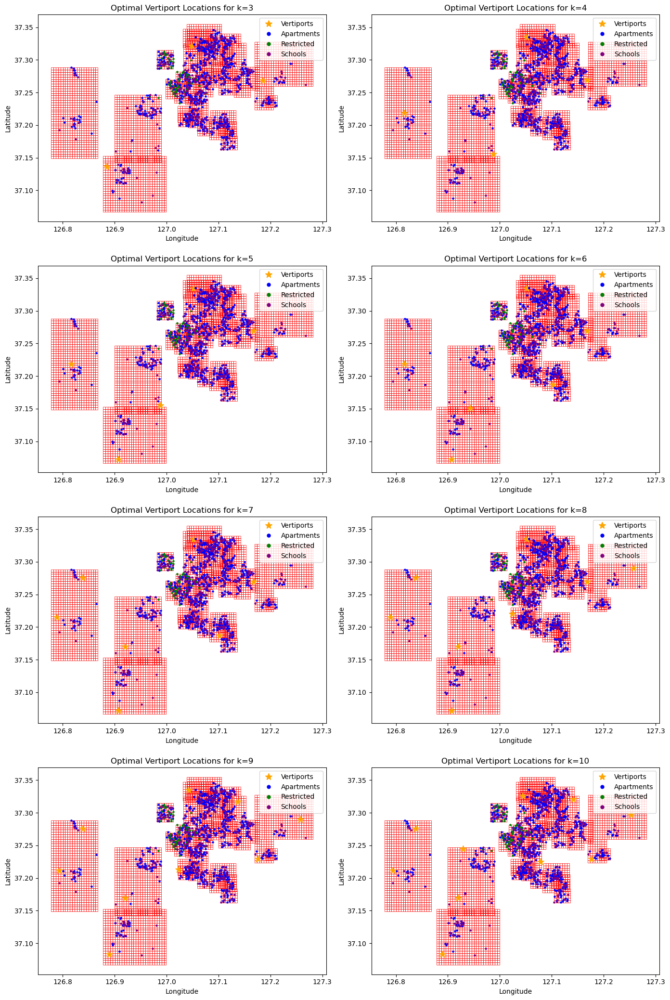

In [24]:
def plot_optimal_locations_separate(grid_gdf, results_dict, fig_size=(14, 21)):
    num_plots = len(results_dict)
    ncols = 2
    nrows = (num_plots + 1) // ncols  # 계산을 통해 nrows를 동적으로 조정

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=fig_size)
    axes = axes.flatten()  # Flatten to 1D array for easier iteration

    for i, (k, locations) in enumerate(results_dict.items()):
        ax = axes[i]
        grid_gdf.to_crs(epsg=4326).plot(ax=ax, facecolor='none', edgecolor='red', linewidth=0.5)

        selected_candidates = grid_gdf.iloc[locations]
        ax.scatter(selected_candidates['longitude'], selected_candidates['latitude'], color='orange', s=100, marker='*')

        demand_points.to_crs(epsg=4326).plot(ax=ax, color='blue', markersize=5, marker='o')
        restricted_areas.to_crs(epsg=4326).plot(ax=ax, color='green', markersize=5, marker='o')
        schools.to_crs(epsg=4326).plot(ax=ax, color='purple', markersize=5, marker='o')

        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        ax.set_title(f'Optimal Vertiport Locations for k={k}')

        # Create custom legends
        star = mlines.Line2D([], [], color='orange', marker='*', linestyle='None', markersize=10, label='Vertiports')
        blue_dot = mlines.Line2D([], [], color='blue', marker='o', linestyle='None', markersize=5, label='Apartments')
        green_dot = mlines.Line2D([], [], color='green', marker='o', linestyle='None', markersize=5, label='Restricted')
        purple_dot = mlines.Line2D([], [], color='purple', marker='o', linestyle='None', markersize=5, label='Schools')
        ax.legend(handles=[star, blue_dot, green_dot, purple_dot])

    # Remove unused axes if any
    for j in range(i + 1, nrows * ncols):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# plot_optimal_locations_separate 함수를 호출하여 결과를 표시
plot_optimal_locations_separate(grid_gdf, results_dict)


In [22]:
m = folium.Map(
    location=center, 
    zoom_start=12, 
    # width=map_width, 
    # height=map_height
)

# Define the colormap
colormap = plt.cm.Reds

# Add the GeoJson for each area
for _, row in merged_gdf.iterrows():
    norm = (row['sum'] - min_value) / (max_value - min_value)  # Normalize the 'sum' values
    color_hex = mcolors.rgb2hex(colormap(norm)[:3])  # Convert RGB to HEX

    folium.GeoJson(
        row.geometry.__geo_interface__,
        style_function=lambda x, color=color_hex: {
            'fillColor': color,
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0.7
        },
        tooltip=f"행정동코드: {row['EMD_CD']}, 가중합: {row['sum']}"
    ).add_to(m)

# Create a feature group for each k and add vertiport locations as markers
for k, indices in results_dict.items():
    fg = folium.FeatureGroup(name=f'Vertiports for k={k}', show=False)
    for idx in indices:
        loc = grid_gdf.iloc[idx]
        folium.Marker(
            [loc.geometry.centroid.y, loc.geometry.centroid.x],
            icon=folium.Icon(color='red', icon='star'),
            tooltip=f"Vertiport for k={k}"
        ).add_to(fg)
    fg.add_to(m)

# Add layer control to toggle visibility of each feature group
LayerControl().add_to(m)
m.save('vertiport_map.html') 
# Display the map
m


In [27]:
def transform_to_latlon(indices, candidates_gdf):
    candidates_latlon = candidates_gdf.to_crs(epsg=4326)
    results_with_latlon = []
    for idx in indices:
        point = candidates_latlon.iloc[idx].geometry
        latitude = point.y
        longitude = point.x
        results_with_latlon.append({
            "Index": idx,
            "Latitude": latitude,
            "Longitude": longitude
        })
    return results_with_latlon

# 위경도 좌표와 주소 가져오기
def get_coordinates_and_addresses(result_indices, candidates_gdf):
    geolocator = Nominatim(user_agent="vertiport_locator")
    results_with_addresses = []

    candidates_latlon = candidates_gdf.to_crs(epsg=4326)  # 위경도 변환
    for idx in result_indices:
        point = candidates_latlon.iloc[idx].geometry
        latitude = point.y
        longitude = point.x
        try:
            location = geolocator.reverse((latitude, longitude), language='en')
            address = location.address if location else "Address not found"
        except Exception as e:
            address = f"Error retrieving address: {str(e)}"
        results_with_addresses.append({
            "Index": idx,
            "Latitude": latitude,
            "Longitude": longitude,
            "Address": address
        })
    return results_with_addresses

# k = 3 ~ 10에 대해 결과 출력
all_results_with_addresses = {}

for k in range(3, 11):
    if k in results_dict:
        result_indices = results_dict[k]
        results_with_addresses = get_coordinates_and_addresses(result_indices, candidates)
        all_results_with_addresses[k] = results_with_addresses

        print(f"Results for k={k}:")
        for result in results_with_addresses:
            print(f"Index: {result['Index']}, Latitude: {result['Latitude']}, Longitude: {result['Longitude']}, Address: {result['Address']}")
        print("\n")
    else:
        print(f"No results for k={k}\n")

Results for k=3:
Index: 316, Latitude: 37.32191031341334, Longitude: 127.04811109693262, Address: Suji-gu, Yongin-si, Gyeonggi, 16804, South Korea
Index: 684, Latitude: 37.26843109929424, Longitude: 127.1855916269399, Address: Sudogwon Je2sunhwan Expressway, Cheoin-gu, Yongin-si, Gyeonggi, 17018, South Korea
Index: 3254, Latitude: 37.136547138057374, Longitude: 126.88496728747924, Address: Goju-ri, Hwaseong-si, Gyeonggi, 18577, South Korea


Results for k=4:
Index: 1508, Latitude: 37.26948249277406, Longitude: 127.16791066615708, Address: Dongbaek 1-ro, Giheung-gu, Yongin-si, Gyeonggi, 17014, South Korea
Index: 1939, Latitude: 37.334577862908375, Longitude: 127.05153286311172, Address: Sinbong-dong, Suji-gu, Yongin-si, Gyeonggi, 16803, South Korea
Index: 3185, Latitude: 37.15534810961339, Longitude: 126.9876110878912, Address: 발산5길, Balsan-ri, Hwaseong-si, Gyeonggi, 18518, South Korea
Index: 4190, Latitude: 37.21845228514207, Longitude: 126.81623769439481, Address: Namyangseo-ro, Wonch